In [1]:
import scipy.io as sio
import pandas as pd

In [2]:
def getDataSet():
    curr_path = os.getcwd()
    data_path = os.path.join(curr_path, "dataset")
    mat_data_path = os.path.join(data_path, "Etch")
    if not os.path.exists(mat_data_path):
        os.makedirs(mat_data_path)
    file_list = os.listdir(mat_data_path)
    mat_list = [file_name for file_name in file_list if file_name.endswith(".mat")]
    print('find mat file : ', mat_list)
    
    correctdata = None
    wrongData = None

    for mat_file in mat_list:
        file_path = os.path.join(mat_data_path, mat_file)
        data = sio.loadmat(file_path)
        key = ''
        for i in data.keys():
            key = i
        print(key)
        correctdata = data[key][0][0][1]
        wrongData = data[key][0][0][3]

    dataSet = []
    for j in range(0, 21):
        dataSubSet = []
        for i in range(0, 102):
            if i == 101:
                dataSubSet.append(wrongData[1][0][0:90, j])
            elif i == 55:
                continue # this data is not normal
            else:
                dataSubSet.append(correctdata[i][0][0:90, j])
        # wrong
        dataSet.append(dataSubSet)

    listBounds = []
    for data in dataSet:
        _max = max(map(max, data))
        _min = min(map(min, data))
        upperBound = _max + (_max - _min) * 0.1
        lowerBound = _min - (_max - _min) * 0.1
        listBounds.append((lowerBound, upperBound))


    return dataSet, listBounds

In [3]:
dataSet, listBounds = getDataSet()

find mat file :  ['MACHINE_Data.mat']
LAMDATA


In [4]:
# set parameters
from _slade_mts import SladeMts
segmentLength = 10
paaSize = 2 # every single time
alphabetSize = 5
pStep = 10
seriesLen = 90
sladeMts = SladeMts(dataSet = dataSet, listBounds = listBounds, segmentLength = segmentLength, alphabetSize = alphabetSize, paaSize = paaSize, pStep = pStep, seriesLen = seriesLen)
listPatterns = sladeMts.patternGenerate()
listNewTimeSeries, patternLocations = sladeMts.dataTransformation(dataSet, listPatterns)

正在生成patterns...
0.0
0.047619047619047616
0.09523809523809523
0.14285714285714285
0.19047619047619047
0.23809523809523808
0.2857142857142857
0.3333333333333333
0.38095238095238093
0.42857142857142855
0.47619047619047616
0.5238095238095238
0.5714285714285714
0.6190476190476191
0.6666666666666666
0.7142857142857143
0.7619047619047619
0.8095238095238095
0.8571428571428571
0.9047619047619048
0.9523809523809523
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100


(101, 12)
            0         1         2         3         4         5    6  \
0    0.000000  1.000000  1.414214  1.590786  3.162278  2.236068  0.0   
1    1.414214  1.000000  1.000000  1.763689  2.645751  2.236068  1.0   
2    1.414214  1.000000  1.000000  1.063297  2.645751  2.000000  1.0   
3    1.414214  1.000000  1.000000  1.063297  2.645751  1.732051  1.0   
4    1.414214  1.000000  1.000000  1.063297  2.645751  1.732051  1.0   
..        ...       ...       ...       ...       ...       ...  ...   
96   1.414214  1.414214  1.000000  1.445891  2.645751  2.449490  1.0   
97   1.414214  1.000000  1.000000  1.445891  2.645751  2.000000  1.0   
98   1.414214  1.000000  1.414214  1.946946  2.645751  2.449490  1.0   
99   1.414214  1.000000  1.000000  1.676484  2.645751  2.449490  1.0   
100  1.414214  1.000000  1.000000  2.032388  4.242641  4.358899  2.0   

            7         8         9        10        11   12  
0    2.236068  7.140581  1.414214  1.414214  3.162278    0  
1  

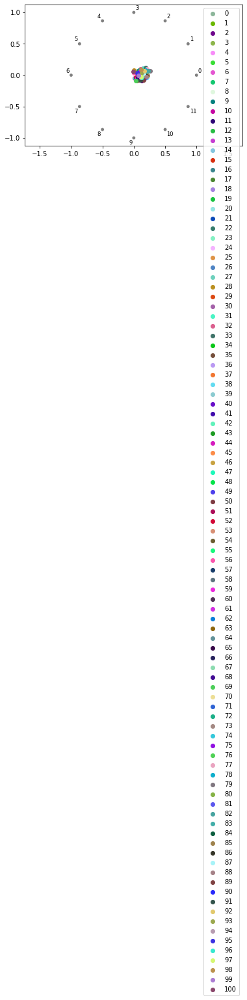

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
from _slade_mts import SladeMts

featureNum = 12
selectedFeature, idx = SladeMts.featureSelection(listNewTimeSeries, featureNum)

# -------------- plot ----------------#
shape = selectedFeature.shape
print(shape)
columnNames = []
for i in range(0, shape[1]):
    columnNames.append(str(i))
df = pd.DataFrame(selectedFeature, columns = columnNames)
df[str(shape[1])] = '1'
for i in range(0, shape[0]):
    df[str(shape[1])][i] = str(i)
print(df)
pd.plotting.radviz(df, str(shape[1]))
plt.show()

In [9]:
from sklearn.cluster import DBSCAN
import numpy as np
res = []
# 迭代不同的eps值
for min_samples in range(2,10):
    # 迭代不同的min_samples值
    for eps in np.arange(1,3,0.1):
        dbscan = DBSCAN(eps = eps, min_samples = min_samples)
        # 模型拟合
        dbscan.fit(selectedFeature)
        # 统计各参数组合下的聚类个数（-1表示异常点）
        n_clusters = len([i for i in set(dbscan.labels_) if i != -1])
        # 异常点的个数
        outliners = np.sum(np.where(dbscan.labels_ == -1, 1,0))
        # 统计每个簇的样本个数
        stats = str(pd.Series([i for i in dbscan.labels_ if i != -1]).value_counts().values)
        res.append({'eps':eps,'min_samples':min_samples,'n_clusters':n_clusters,'outliners':outliners,'stats':stats})
# 将迭代后的结果存储到数据框中
pd.set_option('display.max_rows', None)        
df = pd.DataFrame(res)
print(df)

     eps  min_samples  n_clusters  outliners          stats
0    1.0            2           4         20  [51 22  4  4]
1    1.1            2           2         16        [81  4]
2    1.2            2           1         15           [86]
3    1.3            2           1         10           [91]
4    1.4            2           1          8           [93]
5    1.5            2           2          5        [94  2]
6    1.6            2           2          5        [94  2]
7    1.7            2           2          4        [95  2]
8    1.8            2           1          4           [97]
9    1.9            2           1          3           [98]
10   2.0            2           1          2           [99]
11   2.1            2           1          2           [99]
12   2.2            2           1          1          [100]
13   2.3            2           1          1          [100]
14   2.4            2           1          1          [100]
15   2.5            2           1       

In [11]:
from _slade_mts import SladeMts
eps = 2.4
min_samples = 9
sensibility = 3
anomalyIndex,anomalyLocations = SladeMts.anomalyDetection_DBScan(selected_features = selectedFeature, features_idx = idx, patternLocations = patternLocations, eps = eps, min_samples = min_samples, sensibility = sensibility)
#print(len(dataSet[0]))
print(anomalyIndex)
print(anomalyLocations)

[100]
[[(20, 10, 20), (20, 50, 60)]]


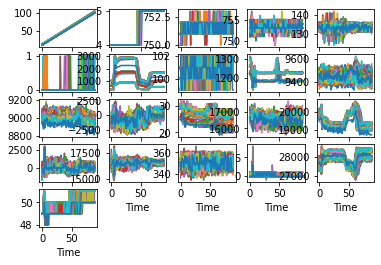

In [4]:
import matplotlib.pyplot as plt
fig = plt.figure()
cnt = 1
for data in dataSet:
    ax = fig.add_subplot(5, 5, cnt)
    ax.set_xlabel('Time')
    for i in range(0, len(data)):
        ax.plot(data[i])

    cnt += 1
plt.show()

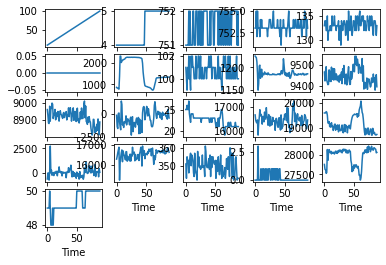

In [8]:
import matplotlib.pyplot as plt
fig = plt.figure()
cnt = 1
for data in dataSet:
    ax = fig.add_subplot(5, 5, cnt)
    ax.set_xlabel('Time')
    ax.plot(data[len(data)-1])
    cnt += 1
plt.show()

In [12]:
anomalyDict = {}

for i in range(0, len(anomalyIndex)):
    for location in anomalyLocations[i]:
        dim = location[0]
        if anomalyDict.get(location[0]) == None:
            anomalyDict[dim] = []
        anomalyDict[dim].append((anomalyIndex[i], location[1], location[2]))
print(anomalyDict) 

{20: [(100, 10, 20), (100, 50, 60)]}


!!!
!!!


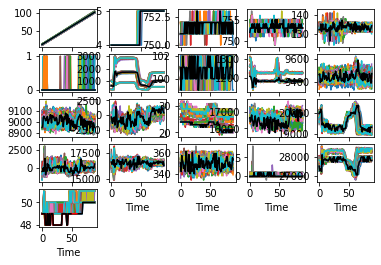

In [13]:
fig = plt.figure()
cnt = 1
mainSeries = 100
for data in dataSet:
    ax = fig.add_subplot(5, 5, cnt)
    ax.set_xlabel('Time')
    for series in data:
        ax.plot(series)
    ax.plot(data[mainSeries], color = 'black')

    if anomalyDict.get((cnt-1)) != None:
        locations = anomalyDict[cnt-1]
        for location in locations:
            if location[0] == mainSeries:
                print('!!!')
                ax.plot(data[mainSeries][0:location[2]], color = 'red')
                ax.plot(data[mainSeries][0:location[1]], color = 'black')
    cnt += 1
plt.show()

!!!


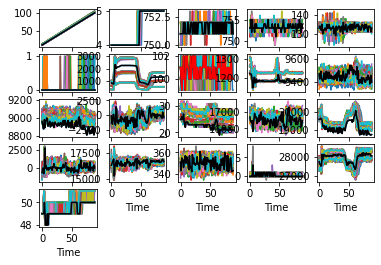

In [18]:
fig = plt.figure()
cnt = 1
mainSeries = 100
for data in dataSet:
    ax = fig.add_subplot(5, 5, cnt)
    ax.set_xlabel('Time')
    for series in data:
        ax.plot(series)
    ax.plot(data[mainSeries], color = 'black')

    if anomalyDict.get((cnt-1)) != None:
        locations = anomalyDict[cnt-1]
        for location in locations:
            if location[0] == mainSeries:
                print('!!!')
                ax.plot(data[mainSeries][0:location[2]], color = 'red')
                ax.plot(data[mainSeries][0:location[1]], color = 'black')
    cnt += 1
plt.show()